# **Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
import cv2
import numpy as np
import csv
import matplotlib.pyplot as plt
import pickle
import glob
from moviepy.editor import VideoFileClip
%matplotlib inline

## Distortion
Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that you can get correct and useful information out of them.

###  Radial distortion and Tangential distortion
Real cameras use curved lenses to form an image, and light rays often bend a little too much or too little at the edges of these lenses. This creates an effect that distorts the edges of images, so that lines or objects appear more or less curved than they actually are. This is called radial distortion, and it’s the most common type of distortion.

Another type of distortion, is tangential distortion. This occurs when a camera’s lens is not aligned perfectly parallel to the imaging plane, where the camera film or sensor is. This makes an image look tilted so that some objects appear farther away or closer than they actually are.

---
**Notes: Tips: *Pinhole camera images are free from distortion, but lenses tend to introduce image distortion.**



## Finding Corners

We can use the OpenCV functions cv2.findChessboardCorners() and cv2.drawChessboardCorners() to automatically find and draw corners in an image of a chessboard pattern.

To learn more about both of those functions, you can have a look at the OpenCV documentation here:

[findChessboardCorners()](http://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.findChessboardCorners) and [drawChessboardCorners()](http://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.drawChessboardCorners) .

**Keep in mind that "corners" are only points where two black and two white squares intersect, in other words, only count inside corners, not outside corners.**

In [2]:
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

img_list = glob.glob('camera_cal/calibration*.jpg')
print("Calibration camera examples counts: %d"%len(img_list))
for idx, iname in enumerate(img_list):
    img = cv2.imread(iname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(9,6),None)
    # print(corners)
    # If found, add abject points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img,(9,6),corners,ret)
#         cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()
print("Finding Corners done")

Calibration camera examples counts: 20
Finding Corners done


## Calibrating the camera
There are two main steps to this process: use chessboard images to obtain image points and object points, and then use the OpenCV functions cv2.calibrateCamera() and cv2.undistort() to compute the calibration and undistortion.

Camera calibration, given object points, image points, and the shape of the grayscale image:


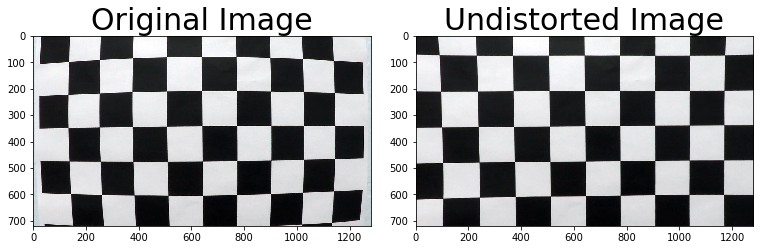

In [4]:
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0]) # or gray.shape[::-1]

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
# undistort the test image
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('./examples/undistort_output')
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Apply a distortion correction to raw images.

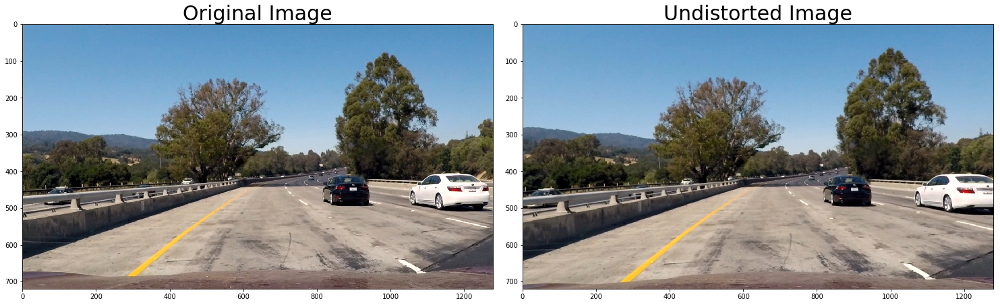

In [5]:
image = cv2.cvtColor(cv2.imread("test_images/test1.jpg"),cv2.COLOR_BGR2RGB)
# Undistorting Test image
undistorted = cv2.undistort(image,mtx, dist, None, mtx)

# Visualize undistortion on test images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Gradient
Now consider how you can use various aspects of your gradient measurements (x, y, magnitude, direction) to isolate lane-line pixels. Specifically, think about how you can use thresholds of the x and y gradients, the overall gradient magnitude, and the gradient direction to focus on pixels that are likely to be part of the lane lines.

### Color transforms and Gradient
You can see that the gradients taken in both the x and the y directions detect the lane lines and pick up other edges. Taking the gradient in the x direction emphasizes edges closer to vertical. Alternatively, taking the gradient in the y direction emphasizes edges closer to horizontal.

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    """Calculate directional gradient.
    Applying the Sobel operator to an image is a way of 
    taking the derivative of the image in the x or y direction. 
    The operators for Sobel x and Sobel y respectively"""
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    abs_sobel = np.absolute(sobel)
    scaled = np.uint8(255*abs_sobel / np.max(abs_sobel))
    
    sobel_binary = np.zeros_like(scaled)
    sobel_binary[(scaled >= thresh[0]) & (scaled <= thresh[1])] = 1
    
    return sobel_binary

def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s = hls[:, :, 2]
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(s)
    binary_output[(s>thresh[0]) & (s <= thresh[1])] = 1
    return binary_output
    
def LAB_thresh(img, thresh=(0, 255)):
    lab = cv2.cvtColor(img,cv2.COLOR_RGB2LAB)
    B = lab[:,:,2]
    binary_B = np.zeros_like(B)
    binary_B[(B > thresh[0])&(B <= thresh[1])] = 1
    return binary_B

def color_lines(image):
    
    img = np.copy(image)
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    
    lower = np.uint8([  0, 200,   0])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(hls, lower, upper)
    
    lower = np.uint8([ 5,   0, 100])
    upper = np.uint8([ 60, 255, 255])
    yellow_mask = cv2.inRange(hls, lower, upper)
    # combine the mask
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    combined_binary = cv2.bitwise_and(image, image, mask = mask)
    
    combined_binary = cv2.cvtColor(combined_binary, cv2.COLOR_RGB2GRAY).astype(np.float)/255
    
    return combined_binary

### Magnitude of the Gradient
 apply a threshold to the overall magnitude of the gradient, in both x and y.

The magnitude, or absolute value, of the gradient is just the square root of the squares of the individual x and y gradients. For a gradient in both the x and y directions, the magnitude is the square root of the sum of the squares.

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """Define a function that applies Sobel x and y, 
    then computes the magnitude of the gradient
    and applies a threshold"""
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    gradient_magnitude = np.uint8(255* gradient_magnitude/np.max(gradient_magnitude))
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as binary_output image
    binary_output = np.zeros_like(gradient_magnitude)
    binary_output[(gradient_magnitude >= mag_thresh[0]) & (gradient_magnitude <= mag_thresh[1])] = 1
    return binary_output

### Direction of the Gradient

In the case of lane lines, we're interested only in edges of a particular orientation. So now we will explore the direction, or orientation, of the gradient.
The direction of the gradient is simply the inverse tangent (arctangent) of the y gradient divided by the x gradient.

Each pixel of the resulting image contains a value for the angle of the gradient away from horizontal in units of radians, covering a range of -π/2 to π/2. An orientation of 0 implies a vertical line and orientations of 
+/-π/2 imply horizontal lines. 

we actually utilize np.arctan2, which can return values between +/-π; however, as we'll take the absolute value of sobelx, this restricts the values to **+/−π/2**, as shown [here](https://en.wikipedia.org/wiki/Atan2).

In [8]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """Define a function that applies Sobel x and y, 
    then computes the direction of the gradient
    and applies a threshold."""
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as binary_output image
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

###  create a thresholded binary image
Making a selection for pixels where both the x and y gradients meet the threshold criteria, or the gradient magnitude and direction are both within their threshold values.

It's time to combine color and gradient thresholding to get the best of both worlds

In [9]:
def color_gradient_combined(undistort, ksize=3):
    """combined color and gradient thresholds for lane detection"""
     # Gradient in X and Y direction
    gradx = abs_sobel_thresh(undistort, orient='x', sobel_kernel=ksize, thresh=(50, 100))
    grady = abs_sobel_thresh(undistort, orient='y', sobel_kernel=ksize, thresh=(50, 100))
    
    # Gradient Magnitude
    mag_binary = mag_thresh(undistort, sobel_kernel=ksize, mag_thresh=(70, 100))
    
    # Gradient Direction
    dir_binary = dir_threshold(undistort, sobel_kernel=ksize, thresh=(0.3, 0.9))
    
    # Lightness Value from HSL Colorspace
    l_binary = LAB_thresh(undistort, thresh=(130, 255))
    
    # Saturation Value from HLS Colorspace
    s_binary = hls_select(undistort, thresh=(180, 255))
    
    combined_binary = color_lines(undistort)
    
    color_combined = np.zeros_like(s_binary)
    color_combined[((gradx == 1) & (grady == 1)) | 
                    ((mag_binary == 1) & (dir_binary == 1) | (s_binary == 1)) &
                   ((s_binary == 1) & (l_binary == 1)) |(combined_binary > 0)]=1
    
    return color_combined

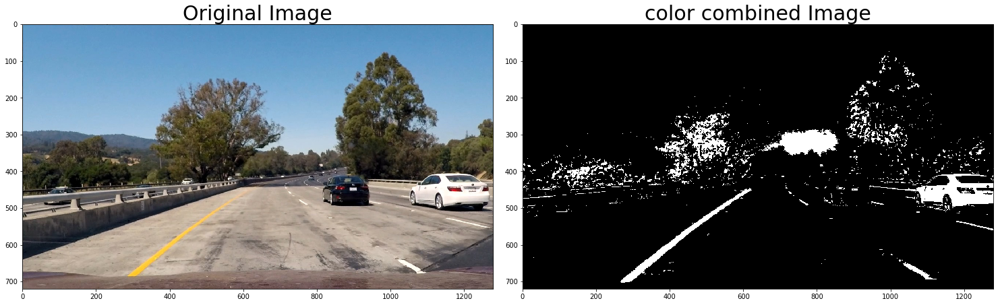

In [10]:
image = cv2.cvtColor(cv2.imread("test_images/test1.jpg"),cv2.COLOR_BGR2RGB)

# Undistorting Test image
undistorted = cv2.undistort(image,mtx, dist, None, mtx)
color_combined = color_gradient_combined(undistorted)

# Visualize undistortion on test images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(color_combined, cmap='gray')
ax2.set_title('color combined Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./examples/binary_combo_example.jpg')

### Perspective transform

A perspective transform maps the points in a given image to different, desired, image points with a new perspective. The perspective transform you’ll be most interested in is **a bird’s-eye view** transform that let’s us view a lane from above; this will be useful for calculating the lane curvature later on. Aside from creating a bird’s eye view representation of an image, a perspective transform can also be used for all kinds of different view points.

In [11]:
def perspective_transform(img):
    # Pass in your image into this function
    # Write code to do the following steps
    image_size = (img.shape[1], img.shape[0])
    # a) define 4 source points src = np.float32([[,],[,],[,],[,]])
         #Note: you could pick any four of the detected corners 
         # as long as those four corners define a rectangle
         #One especially smart way to do this would be to use four well-chosen
         # corners that were automatically detected during the undistortion steps
         #We recommend using the automatic detection of corners in your code
    # b) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    # c) use cv2.getPerspectiveTransform() to get M, the transform matrix
    # d) use cv2.warpPerspective() to warp your image to a top-down view
    src = np.float32(
    [[188,675],
     [586,450],
     [694,450],
     [1092,675]])

    dst = np.float32(
        [[280,720],
         [280,0],
         [1000,0],
         [1000,720]])

    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, image_size, flags = cv2.INTER_LINEAR)
    return warped, M_inv

def transform_combined(img):
    """image color type should be RGB"""
    undistort=cv2.undistort(img, mtx, dist, None, mtx)
    
    warped_img, M_inv = perspective_transform(undistort)
    
    combined_img = color_gradient_combined(warped_img)
   
    return combined_img, undistort, M_inv

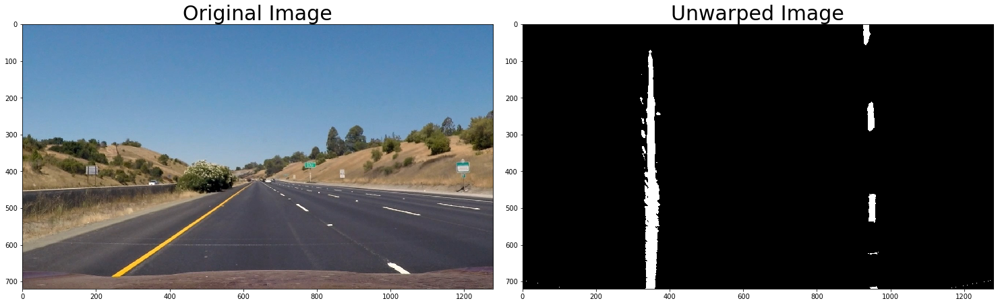

In [12]:
image = cv2.cvtColor(cv2.imread("test_images/straight_lines1.jpg"),cv2.COLOR_BGR2RGB)

# unwarp Test image
combined_wrap_img, undistort, M_inv = transform_combined(image)

# Visualize undistortion on test images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined_wrap_img, cmap='gray')
ax2.set_title('Unwarped Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./examples/warped_straight_lines.jpg')

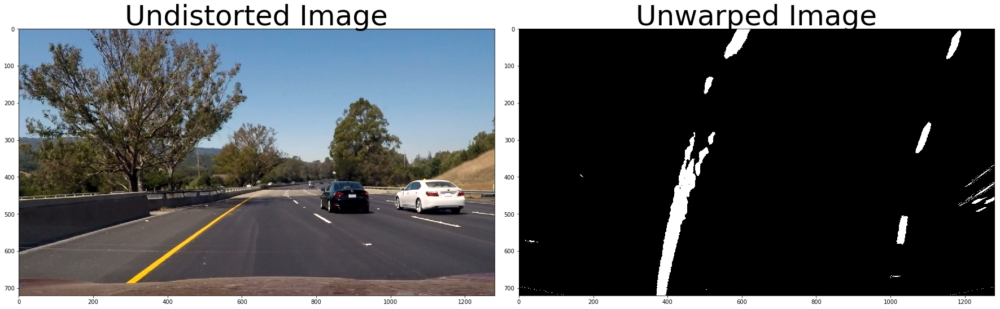

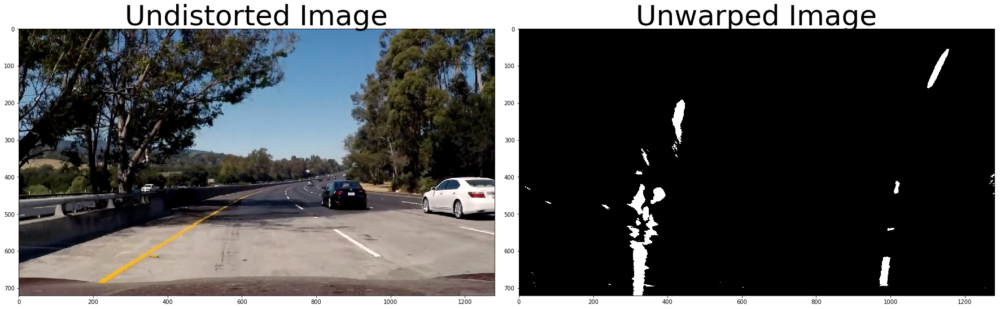

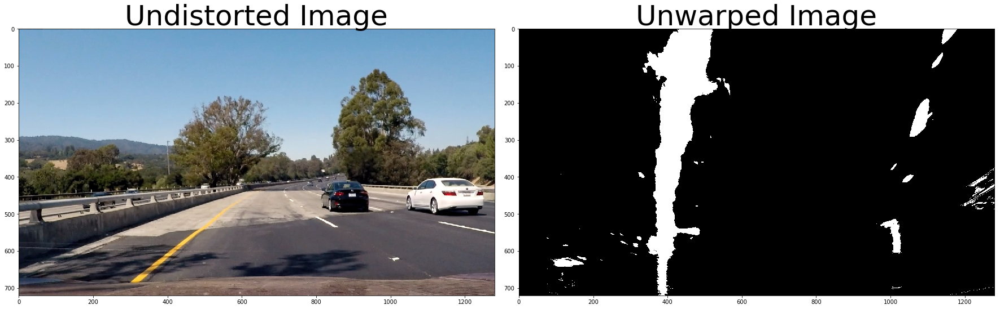

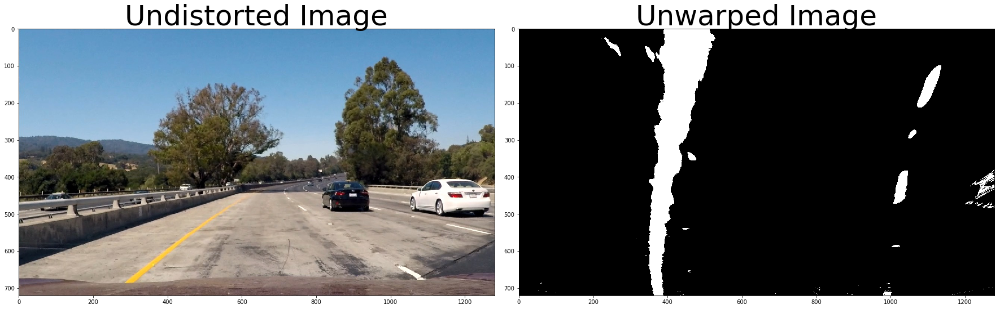

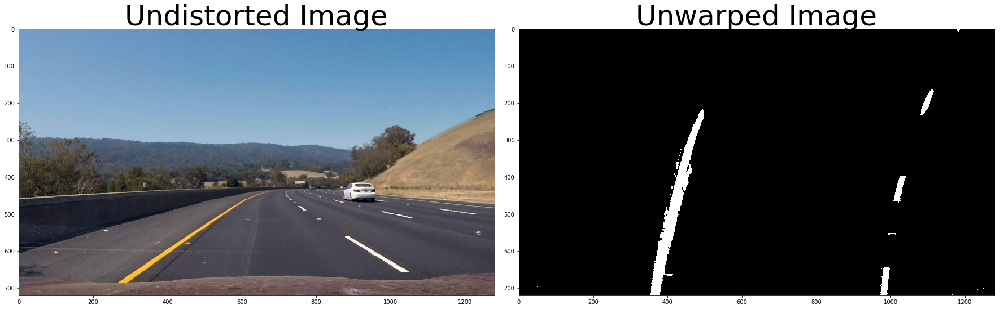

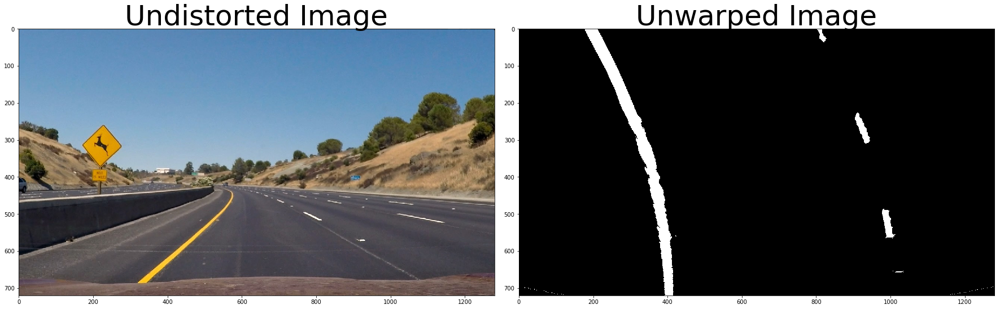

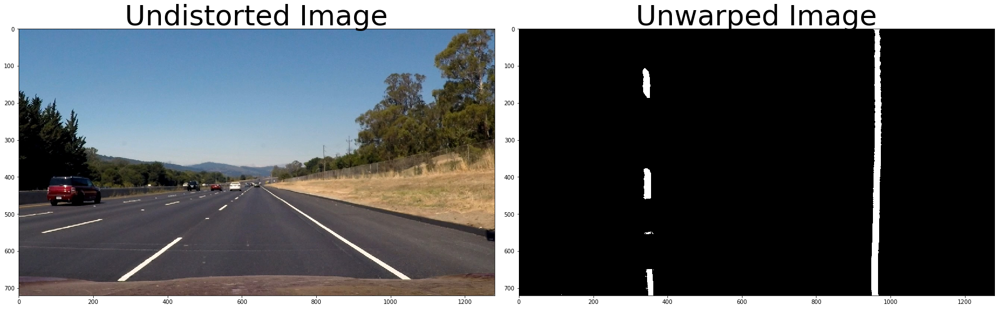

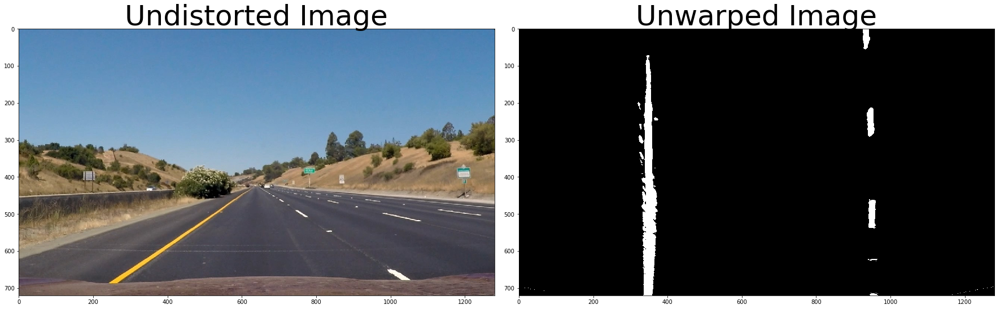

In [13]:
test_img_list =  list(map(lambda imageFileName: (imageFileName, cv2.imread(imageFileName)), 
                      glob.glob('test_images/*.jpg')))
# Test on test images
for image_index in range(len(test_img_list)):
    image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
    #roi = region_of_interest(image)
    combined_wrap_img, undistort, M_inv = transform_combined(image)
   # Plot the 2 images side by side
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax2.imshow(combined_wrap_img, cmap='gray')
    ax2.set_title('Unwarped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    #plt.savefig('unwarp_distort{}'.format(image_index))
    plt.show()

###  Detecting Lane Lines and Fit a Polynomial
After applying calibration, thresholding, and a perspective transform to a road image, you should have a binary image where the lane lines stand out clearly. However, you still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.

I first take a histogram along all the columns in the lower half of the image like this:

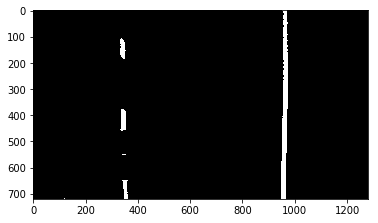

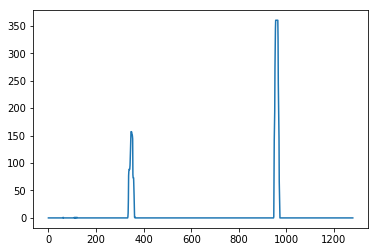

In [14]:
image = cv2.cvtColor(cv2.imread("test_images/straight_lines2.jpg"),cv2.COLOR_BGR2RGB)

# unwarp Test image
combined_wrap_img, undistort, M_inv = transform_combined(image)
plt.imshow(combined_wrap_img,cmap='gray')
plt.show()

# Line Finding Method: Peaks in a Histogram
histogram = np.sum(combined_wrap_img[combined_wrap_img.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.savefig('./examples/straight_lines1_hist2')

### Implement Sliding Windows and Fit a Polynomial
With this histogram I am adding up the pixel values along each column in the image. In my thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. I can use that as a starting point for where to search for the lines. From that point, I can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.

---
**Calculating Lane Curvature**  
one way to calculate the curvature of a lane line, is to fit a 2nd degree polynomial to that line, and from this you can easily extract useful information.

For a lane line that is close to vertical, you can fit a line using this formula: f(y) = Ay^2 + By + C, where A, B, and C are coefficients.

A gives you the curvature of the lane line, B gives you the heading or direction that the line is pointing, and C gives you the position of the line based on how far away it is from the very left of an image (y = 0).


In [15]:
def fit_polynomial(binary_warped):
    """Assuming you have created a warped binary image called binary_warped"""
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 85
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit, left_lane_inds, right_lane_inds

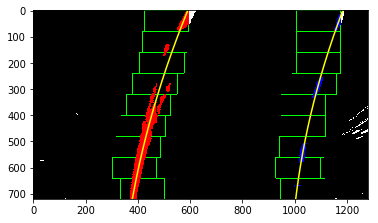

In [16]:

image = cv2.cvtColor(cv2.imread("test_images/test6.jpg"),cv2.COLOR_BGR2RGB)
combined_wrap_img, undistort, M_inv = transform_combined(image)
out_img, ploty, left_fitx, right_fitx, left_fit, \
right_fit, left_lane_inds, right_lane_inds = fit_polynomial(combined_wrap_img)

plt.imshow(out_img)
ploty = np.linspace(0, color_combined.shape[0]-1, color_combined.shape[0] )
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.savefig('./examples/color_fit_lines.jpg')

** Skip the sliding windows step once you know where the lines are **  
Now you know where the lines are you have a fit! In the next frame of video you don't need to do a blind search again, but instead you can just search in a margin around the previous line position like this:

In [17]:
def lane_lines_detection(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 85
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx,left_fit, right_fit

def lane_line_visalization(binary_warped, left_fitx,right_fitx, margin = 85):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result


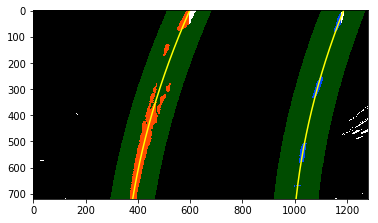

In [18]:
left_fitx, right_fitx, left_fit, right_fit = lane_lines_detection(combined_wrap_img, 
                                                       left_fit, right_fit)
result  = lane_line_visalization(combined_wrap_img, left_fitx, right_fitx)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

In [19]:
def detecting_lane_output(binary_img, undistorted, left_fit, right_fit, M_inv):
    # Create an image to draw the lines on
#     warp_zero = np.zeros_like(image[:, :, 0]).astype(np.uint8)
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    img_size = (binary_img.shape[1],binary_img.shape[0])

    ploty = np.linspace(0, img_size[1]-1, num=img_size[1])# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, img_size)
    
    # Combine the result with the original image
    result = cv2.addWeighted(np.copy(undistorted), 1, newwarp, 0.5, 0)
    return result

Text(0.5,1,'Result of lane detecting')

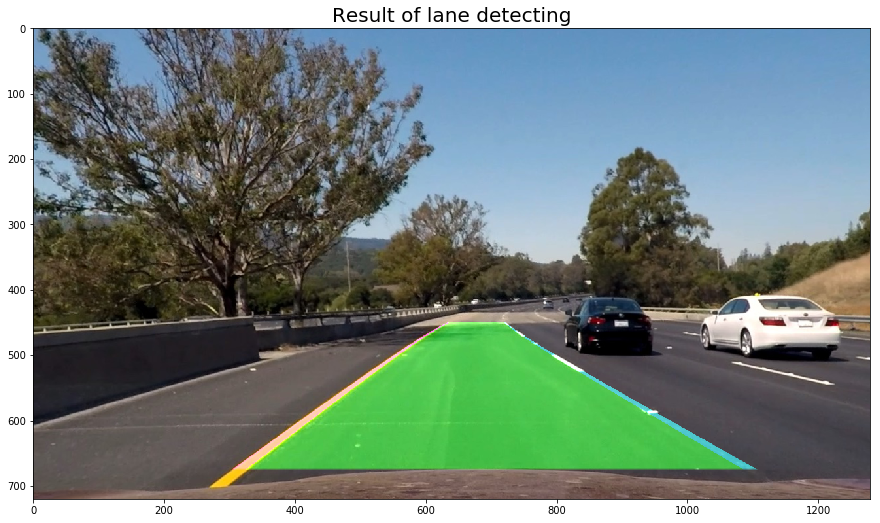

In [20]:
result = detecting_lane_output(combined_wrap_img, undistort, left_fit, right_fit, M_inv)
plt.figure(figsize=(15,10))
plt.imshow(result)
plt.title('Result of lane detecting', fontsize=20)

## Radius of Curvature
The radius of curvature ([awesome tutorial here](http://www.intmath.com/applications-differentiation/8-radius-curvature.php)) at any point x of the function 
$x=f(y)$ is given as follows:

$$R_{curve} = (\frac{(1+ (2Ay+B)^2)^{3/2}}{|2A|}$$

In [21]:
def radius_curvature(final,left_fitx, right_fitx):
    """calculate the radius curvature.
    image could be the result get from lane lines detecting function"""
    # Image size
    h,w = final.shape[0],final.shape[1]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
    
    # Calculating the car position on the image
    car_position = w/2
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    lane_center_position = (left_fitx[-1] + right_fitx[-1]) / 2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    
    return center_dist, left_curverad, right_curverad

def curverad_info_attached(original_img, center_dist, left_curve, right_curve):
    test_img = np.copy(original_img)
    h = test_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    rds_of_curve = (left_curve +right_curve)/2
    text = 'Radius of Curvature = ' + '{:04.2f}'.format(rds_of_curve) + 'm'
    cv2.putText(test_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    direction = ''
    if center_dist > 0:
        direction = 'right'
    else:
        direction = 'left'
    text = 'Vehicle is {:04.3f}'.format(abs(center_dist)) + 'm '+ direction + ' of center'
    cv2.putText(test_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return test_img

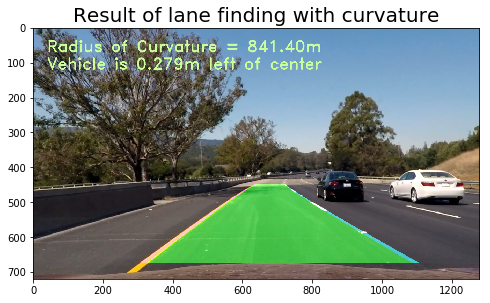

In [22]:
center_distance, left_curverad, right_curverad = radius_curvature(result, left_fitx, right_fitx)

final_output = curverad_info_attached(result, center_distance, left_curverad, right_curverad)
plt.figure(figsize=(8,5))
plt.imshow(final_output)
plt.title('Result of lane finding with curvature', fontsize=20)
plt.savefig("./examples/example_output.jpg")

## Final result on the video

In [23]:
def process_video(input_image):

    combined_wrap_img, undistort, M_inv = transform_combined(input_image)
    
    out_img, ploty, left_fitx, right_fitx, left_fit, \
    right_fit, left_lane_inds, right_lane_inds = fit_polynomial(combined_wrap_img)
    
    result = detecting_lane_output(combined_wrap_img, undistort, left_fit, right_fit, M_inv)
    
    center_distance, left_curverad, right_curverad = radius_curvature(combined_wrap_img, left_fitx, right_fitx)
    
    final_output = curverad_info_attached(result, center_distance, left_curverad, right_curverad)

    # Returning the final image for the video
    return final_output

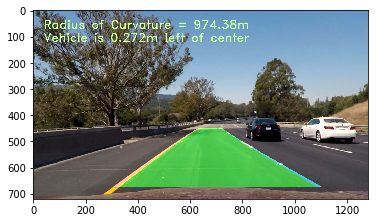

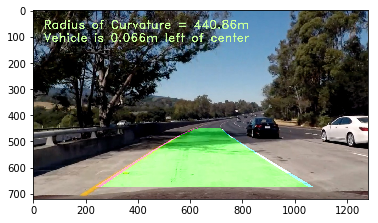

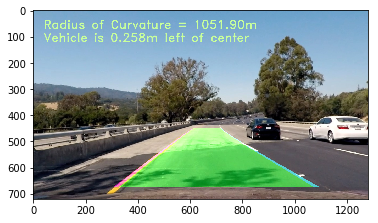

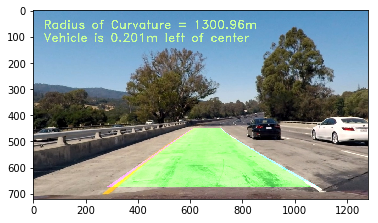

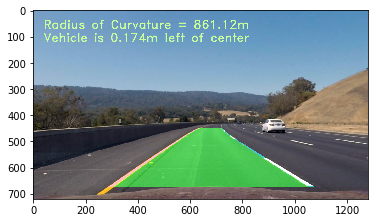

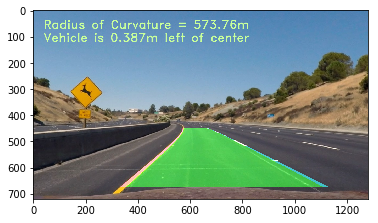

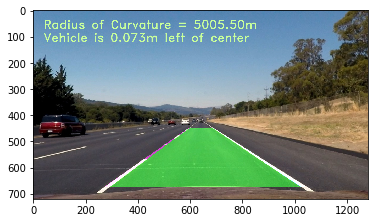

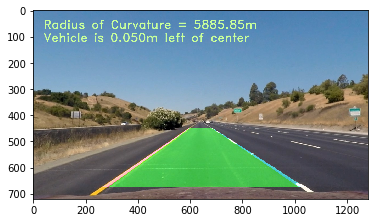

In [24]:
for image_index in range(len(test_img_list)):
    image = cv2.cvtColor(test_img_list[image_index][1],cv2.COLOR_BGR2RGB)
    final = process_video(image)
    plt.imshow(final)
    #plt.savefig('result{}'.format(image_index))
    plt.show()

In [25]:
video_output = "project_video_processed.mp4"
clip1 = VideoFileClip("project_video.mp4")
processed_clip = clip1.fl_image(process_video)
%time processed_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


100%|█████████▉| 1260/1261 [06:31<00:00,  3.17it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 

CPU times: user 19min 29s, sys: 2min 21s, total: 21min 50s
Wall time: 6min 32s
